# Capstone Project - Ocular Disease Recognition


## Information

**Data Source:** <br>
https://www.kaggle.com/datasets/andrewmvd/ocular-disease-recognition-odir5k

**About Dataset:** <br>
Ocular Disease Intelligent Recognition (ODIR) is a structured ophthalmic database of 5,000 patients with age, color fundus photographs from left and right eyes and doctors' diagnostic keywords from doctors.

This dataset is meant to represent ‘‘real-life’’ set of patient information collected by Shanggong Medical Technology Co., Ltd. from different hospitals/medical centers in China. In these institutions, fundus images are captured by various cameras in the market, such as Canon, Zeiss and Kowa, resulting into varied image resolutions.
Annotations were labeled by trained human readers with quality control management. They classify patient into eight labels including:

*   Normal (N)
*   Diabetes (D)
*   Glaucoma (G)
*   Cataract (C)
*   Age related Macular Degeneration (A),
*   Hypertension (H),
*   Pathological Myopia (M),
*   Other diseases/abnormalities (O)

## Environment Setup

### Mount Drive

In [ ]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization
drive.mount('/content/drive')

# Import Unzip Package
# import zipfile

# Unzip file
# location = '/content/drive/MyDrive/Capstone Project/archive.zip'
# zip_ref = zipfile.ZipFile(location, 'r')
# zip_ref.extractall('/content/drive/MyDrive/Capstone Project')

Mounted at /content/drive


### Import Libraries

In [ ]:
# Run this code before run any cell below
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.layers import Flatten, Dense, Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2 
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications.inception_v3 import InceptionV3

from keras.preprocessing.image import ImageDataGenerator

import pandas as pd

import cv2

import numpy as np

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import os
from os import listdir

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.utils.class_weight import compute_class_weight
from sklearn.utils import class_weight 

### Import CSV as Pandas DataFrame

In [ ]:
# Import data label CSV
df = pd.read_csv('/content/drive/MyDrive/Capstone Project/archive/full_df.csv')

# Show all data
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
display(df)

,ID,Patient Age,Patient Sex,Left-Fundus,Right-Fundus,Left-Diagnostic Keywords,Right-Diagnostic Keywords,N,D,G,C,A,H,M,O,filepath,labels,target,filename
0,0,69,Female,0_left.jpg,0_right.jpg,cataract,normal fundus,0,0,0,1,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",0_right.jpg
1,1,57,Male,1_left.jpg,1_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",1_right.jpg
2,2,42,Male,2_left.jpg,2_right.jpg,laser spot，moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",2_right.jpg
3,4,53,Male,4_left.jpg,4_right.jpg,macular epiretinal membrane,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",4_right.jpg
4,5,50,Female,5_left.jpg,5_right.jpg,moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",5_right.jpg
5,6,60,Male,6_left.jpg,6_right.jpg,macular epiretinal membrane,moderate non proliferative retinopathy，epireti...,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",6_right.jpg
6,7,60,Female,7_left.jpg,7_right.jpg,drusen,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",7_right.jpg
7,8,59,Male,8_left.jpg,8_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",8_right.jpg
8,9,54,Male,9_left.jpg,9_right.jpg,normal fundus,vitreous degeneration,0,0,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['O'],"[0, 0, 0, 0, 0, 0, 0, 1]",9_right.jpg
9,10,70,Male,10_left.jpg,10_right.jpg,epiretinal membrane,normal fundus,0,0,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",10_right.jpg


In [ ]:
# Dataframe slicing for filename and labels
df_1 = df.loc[:, ['filename','labels']]
display(df_1)

,filename,labels
0,0_right.jpg,['N']
1,1_right.jpg,['N']
2,2_right.jpg,['D']
3,4_right.jpg,['D']
4,5_right.jpg,['D']
5,6_right.jpg,['D']
6,7_right.jpg,['D']
7,8_right.jpg,['N']
8,9_right.jpg,['O']
9,10_right.jpg,['N']


### Assign Pre-Trained Models

In [ ]:
image_size = 512

vgg = VGG19(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))
mobilenetv2 = MobileNetV2(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))
mobilenetv3small = MobileNetV3Small(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))

for layer in vgg.layers:
  layer.trainable = False

for layer in mobilenetv2.layers:
  layer.trainable = False

for layer in mobilenetv3small.layers:
  layer.trainable = False

4349952/4334752 [==============================] - 0s 0us/step


In [ ]:
# Download the pre-trained weights. No top means it excludes the fully connected layer it uses for classification.
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2022-06-04 14:28:38--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.192.128, 209.85.145.128, 172.217.219.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.192.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M  83.4MB/s    in 1.0s    

2022-06-04 14:28:39 (83.4 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [ ]:
# Set the weights file you downloaded into a variable
local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

# Initialize the base model.
# Set the input shape and remove the dense layers.
pre_trained_model = InceptionV3(input_shape = (512, 512, 3), 
                                include_top = False, 
                                weights = None)

# Load the pre-trained weights you downloaded.
pre_trained_model.load_weights(local_weights_file)

# Freeze the weights of the layers.
for layer in pre_trained_model.layers:
  layer.trainable = False

In [ ]:
# Preprocessing Image (Grayscale)
def to_grayscale_then_rgb(image):
    image = tf.image.rgb_to_grayscale(image)
    image = tf.image.grayscale_to_rgb(image)
    return image

def to_blue(image):
    image = cv2.IMREAD_COLOR(image)
    return image

## Assign Directory & Data Checking

In [ ]:
# assign directory
directory_preprocessed = '/content/drive/MyDrive/Capstone Project/archive/preprocessed_images'
directory_train =  '/content/drive/MyDrive/Capstone Project/archive/ODIR_5K/ODIR_5K/Training Images'
directory_test =  '/content/drive/MyDrive/Capstone Project/archive/ODIR_5K/ODIR_5K/Testing Images'
 
# iterate over files in that directory
preprocessed_counter = 0
train_counter        = 0
test_counter         = 0

# Counting data
for image_name in os.listdir(directory_preprocessed):
  preprocessed_counter += 1

for image_name in os.listdir(directory_train):
  train_counter += 1

for image_name in os.listdir(directory_test):
  test_counter += 1

print(preprocessed_counter)
print(train_counter)
print(test_counter)

6392
7000
1000


## Slicing

In [ ]:
# Dataframe slicing (Cataract)
df_cat = df.loc[df['labels'] == "['C']", ['filename','labels']]
df_cat_augment = shuffle(df_cat)
# df_cat_augment.head()

# Dataframe slicing (Normal)
df_norm = df.loc[df['labels'] == "['N']", ['filename','labels']]
# df_norm.tail()

# Dataframe slicing (Diabetes)
df_diabet = df.loc[df['labels'] == "['D']", ['filename','labels']]

# Dataframe slicing (Glaucoma)
df_gl = df.loc[df['labels'] == "['G']", ['filename','labels']]

# Dataframe slicing (Age related Macular Degeneration)
df_age = df.loc[df['labels'] == "['A']", ['filename','labels']]

print('Cataract Train : ',df_cat.shape[0])
print('Normal Train   : ',df_norm.shape[0])
print('Diabetes Train : ',df_diabet.shape[0])
print('Glaucoma Train : ',df_gl.shape[0])
print('Age Train      : ',df_age.shape[0])

Cataract Train :  293
Normal Train   :  2873
Diabetes Train :  1608
Glaucoma Train :  284
Age Train      :  266


## Undersampling

In [ ]:
# Merged Dataframe (Cataract)
df_2 = pd.concat([df_cat_augment[:266], df_norm[:266], df_diabet[:266], df_gl[:266], df_age[:266]], ignore_index=True, sort=False)
df_2 = shuffle(df_2)

# Split Train and Test from Dataframe
train, val = train_test_split(df_2, test_size=0.2)

In [ ]:
print('Cataract Train Count: ',train[train['labels']=="['C']"].labels.count())
print('Normal Train Count  : ',train[train['labels']=="['N']"].labels.count())
print('Diabetes Train Count: ',train[train['labels']=="['D']"].labels.count())
print('Glaucoma Train Count: ',train[train['labels']=="['G']"].labels.count())
print('Age Train Count     : ',train[train['labels']=="['A']"].labels.count())
print('Cataract Validation Count: ',val[val['labels']=="['C']"].labels.count())
print('Normal Validation Count  : ',val[val['labels']=="['N']"].labels.count())
print('Diabetes Validation Count: ',val[val['labels']=="['D']"].labels.count())
print('Glaucoma Validation Count: ',val[val['labels']=="['G']"].labels.count())
print('Age Validation Count     : ',val[val['labels']=="['A']"].labels.count())

Cataract Train Count:  213
Normal Train Count  :  207
Diabetes Train Count:  221
Glaucoma Train Count:  210
Age Train Count     :  213
Cataract Validation Count:  53
Normal Validation Count  :  59
Diabetes Validation Count:  45
Glaucoma Validation Count:  56
Age Validation Count     :  53


## Model 1

### Image Data Generator

In [ ]:
traingen = ImageDataGenerator(rescale=1./255.,
                              rotation_range = 10,
                              horizontal_flip = True,
                              vertical_flip = True)

train_generator = traingen.flow_from_dataframe(
    train,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

valgen = ImageDataGenerator(rescale=1./255.)

validation_generator = valgen.flow_from_dataframe(
    val,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

Found 1064 validated image filenames belonging to 5 classes.
Found 266 validated image filenames belonging to 5 classes.


### Add Layers

In [ ]:
model = Sequential()
model.add(mobilenetv2)
model.add(Conv2D(128, (3,3), activation='relu'))
model.add(MaxPooling2D(2,2))
model.add(Flatten())
# model.add(Dense(128, activation="relu"))
model.add(Dense(5, activation="softmax"))

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 16, 16, 1280)     2257984   
 ional)                                                          
                                                                 
 conv2d_94 (Conv2D)          (None, 14, 14, 128)       1474688   
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 7, 7, 128)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 6272)              0         
                                                                 
 dense (Dense)               (None, 5)                 31365     
                                                                 
Total params: 3,764,037
Trainable params: 1,506,053
Non-

### Compile Model & Callbacks

In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=10,verbose=1)

### Training Model

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=30,
                    batch_size=10,
                    callbacks=[checkpoint,earlystop],
                    verbose = 1)

Epoch 1/30
34/34 [==============================] - ETA: 0s - loss: 3.3472 - accuracy: 0.3703
Epoch 1: val_accuracy improved from -inf to 0.41353, saving model to CapstoneModel.h5
34/34 [==============================] - 304s 9s/step - loss: 3.3472 - accuracy: 0.3703 - val_loss: 1.1991 - val_accuracy: 0.4135
Epoch 2/30
34/34 [==============================] - ETA: 0s - loss: 1.1614 - accuracy: 0.4784
Epoch 2: val_accuracy improved from 0.41353 to 0.56391, saving model to CapstoneModel.h5
34/34 [==============================] - 281s 8s/step - loss: 1.1614 - accuracy: 0.4784 - val_loss: 1.0849 - val_accuracy: 0.5639
Epoch 3/30
34/34 [==============================] - ETA: 0s - loss: 1.0181 - accuracy: 0.5658
Epoch 3: val_accuracy did not improve from 0.56391
34/34 [==============================] - 284s 8s/step - loss: 1.0181 - accuracy: 0.5658 - val_loss: 1.0438 - val_accuracy: 0.5526
Epoch 4/30
34/34 [==============================] - ETA: 0s - loss: 0.9373 - accuracy: 0.6241
Epoch 4:

### Accuracy & Loss Graph

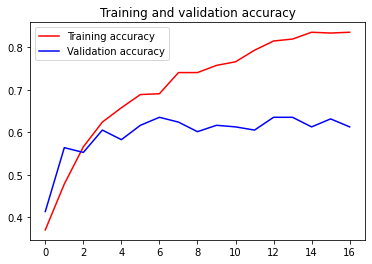

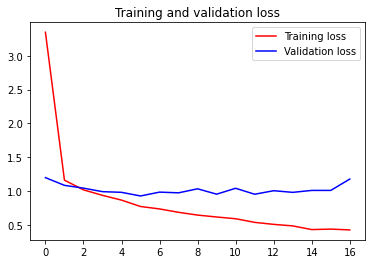

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

## Model 2

In [ ]:
traingen = ImageDataGenerator(rescale = 1./255.,
                              rotation_range = 40,
                              width_shift_range = 0.2,
                              height_shift_range = 0.2,
                              shear_range = 0.2,
                              zoom_range = 0.2,
                              fill_mode = 'nearest',
                              horizontal_flip = True)

train_generator = traingen.flow_from_dataframe(
    train,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

valgen = ImageDataGenerator(rescale=1./255.)

validation_generator = valgen.flow_from_dataframe(
    val,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

Found 1064 validated image filenames belonging to 5 classes.
Found 266 validated image filenames belonging to 5 classes.


In [ ]:
model = Sequential()
model.add(mobilenetv2)
model.add(Conv2D(128, (3,3), activation='relu'))
model.add(MaxPooling2D(2,2))
model.add(Flatten())
# model.add(Dense(128, activation="relu"))
model.add(Dense(5, activation="softmax"))

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 16, 16, 1280)     2257984   
 ional)                                                          
                                                                 
 conv2d_94 (Conv2D)          (None, 14, 14, 128)       1474688   
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 7, 7, 128)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 6272)              0         
                                                                 
 dense (Dense)               (None, 5)                 31365     
                                                                 
Total params: 3,764,037
Trainable params: 1,506,053
Non-

In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=10,verbose=1)

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=30,
                    batch_size=10,
                    callbacks=[checkpoint,earlystop],
                    verbose = 1)

Epoch 1/30
34/34 [==============================] - ETA: 0s - loss: 2.5644 - accuracy: 0.3647 
Epoch 1: val_accuracy improved from -inf to 0.47368, saving model to CapstoneModel.h5
34/34 [==============================] - 701s 20s/step - loss: 2.5644 - accuracy: 0.3647 - val_loss: 1.1580 - val_accuracy: 0.4737
Epoch 2/30
34/34 [==============================] - ETA: 0s - loss: 1.1657 - accuracy: 0.4934
Epoch 2: val_accuracy improved from 0.47368 to 0.50752, saving model to CapstoneModel.h5
34/34 [==============================] - 274s 8s/step - loss: 1.1657 - accuracy: 0.4934 - val_loss: 1.1494 - val_accuracy: 0.5075
Epoch 3/30
34/34 [==============================] - ETA: 0s - loss: 1.1031 - accuracy: 0.5066
Epoch 3: val_accuracy improved from 0.50752 to 0.57143, saving model to CapstoneModel.h5
34/34 [==============================] - 318s 9s/step - loss: 1.1031 - accuracy: 0.5066 - val_loss: 1.0913 - val_accuracy: 0.5714
Epoch 4/30
34/34 [==============================] - ETA: 0s - 

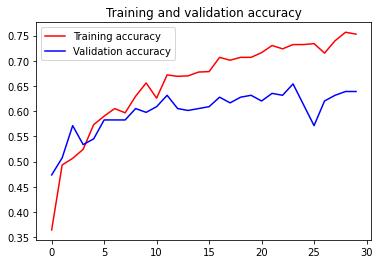

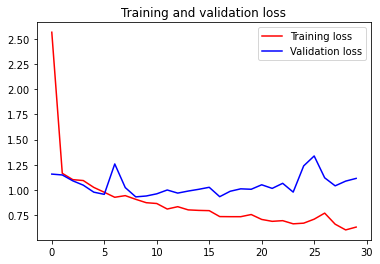

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

In [ ]:
model.save('model.h5')

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

INFO:tensorflow:Assets written to: /tmp/tmpodlgs44c/assets


INFO:tensorflow:Assets written to: /tmp/tmpodlgs44c/assets


In [ ]:
import pathlib

tflite_model_file = pathlib.Path('model.tflite')
tflite_model_file.write_bytes(tflite_model)

14893372

In [ ]:
import numpy as np
from google.colab import files
from keras.preprocessing import image

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = '/content/' + fn
  img = image.load_img(path, target_size=(512, 512))
  x = image.img_to_array(img)
  x /= 255
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images)
  print(classes[0])

Saving Glaucoma_013.png to Glaucoma_013.png
[0.31885958 0.03458912 0.10958659 0.13976529 0.39719945]


In [ ]:
print(train_generator.classes)
# {0:'Age', 1:'Cataract', 2:'Diabetes', 3:'Glaucoma', 4:'Normal'}

[0, 0, 0, 1, 2, 4, 4, 3, 4, 2, 1, 4, 0, 3, 4, 4, 2, 4, 1, 3, 2, 4, 0, 1, 0, 4, 2, 3, 1, 1, 2, 3, 2, 0, 0, 3, 3, 3, 4, 0, 0, 2, 1, 0, 1, 4, 4, 3, 0, 0, 3, 3, 3, 2, 4, 3, 0, 3, 0, 2, 3, 2, 2, 0, 0, 1, 0, 3, 2, 1, 0, 3, 4, 1, 2, 0, 4, 3, 1, 0, 2, 3, 0, 1, 1, 3, 2, 0, 0, 2, 1, 4, 2, 1, 1, 4, 1, 3, 0, 3, 3, 4, 2, 3, 4, 1, 0, 2, 3, 0, 0, 1, 1, 4, 4, 0, 1, 3, 1, 4, 4, 4, 3, 4, 2, 0, 3, 3, 4, 3, 3, 4, 3, 2, 2, 3, 3, 1, 0, 4, 0, 1, 4, 0, 1, 1, 1, 1, 2, 0, 1, 3, 1, 3, 4, 0, 4, 4, 3, 1, 3, 1, 1, 2, 2, 4, 1, 4, 4, 2, 1, 2, 3, 3, 2, 4, 0, 4, 3, 0, 1, 2, 1, 0, 0, 4, 0, 3, 0, 4, 2, 4, 0, 3, 4, 0, 2, 1, 1, 3, 3, 4, 0, 0, 1, 3, 3, 0, 2, 0, 4, 2, 1, 0, 2, 4, 3, 3, 3, 0, 2, 0, 4, 3, 0, 0, 0, 4, 2, 1, 0, 0, 1, 1, 3, 4, 4, 3, 4, 4, 4, 4, 3, 0, 1, 1, 1, 4, 4, 3, 4, 1, 2, 2, 3, 1, 4, 1, 2, 2, 4, 1, 2, 4, 2, 2, 3, 3, 4, 3, 4, 1, 2, 3, 4, 4, 0, 3, 0, 1, 1, 4, 2, 1, 3, 1, 0, 2, 0, 4, 0, 1, 3, 0, 3, 2, 4, 0, 0, 3, 0, 1, 0, 2, 4, 3, 4, 3, 2, 1, 1, 2, 0, 1, 2, 0, 3, 4, 0, 2, 0, 2, 3, 3, 0, 4, 3, 4, 0, 2, 1, 2, 1, 

In [ ]:
train

,filename,labels
1320,1881_left.jpg,['A']
1133,910_right.jpg,['A']
1208,152_left.jpg,['A']
118,2166_left.jpg,['C']
565,186_right.jpg,['D']
418,805_right.jpg,['N']
398,693_right.jpg,['N']
957,1239_left.jpg,['G']
390,653_right.jpg,['N']
713,748_right.jpg,['D']


## Model 3

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
traingen = ImageDataGenerator(rescale = 1./255.,
                              rotation_range = 40,
                              width_shift_range = 0.2,
                              height_shift_range = 0.2,
                              shear_range = 0.2,
                              zoom_range = 0.2,
                              fill_mode = 'nearest',
                              horizontal_flip = True)

train_generator = traingen.flow_from_dataframe(
    train,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

valgen = ImageDataGenerator(rescale=1./255.)

validation_generator = valgen.flow_from_dataframe(
    val,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

Found 1064 validated image filenames belonging to 5 classes.
Found 266 validated image filenames belonging to 5 classes.


In [ ]:
model = Sequential()
model.add(mobilenetv2)
model.add(Conv2D(128, (3,3), activation='relu'))
model.add(MaxPooling2D(2,2))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(32, activation="relu"))
model.add(Dense(5, activation="softmax"))

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 16, 16, 1280)     2257984   
 ional)                                                          
                                                                 
 conv2d (Conv2D)             (None, 14, 14, 128)       1474688   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 7, 7, 128)        0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 6272)              0         
                                                                 
 dense (Dense)               (None, 128)               802944    
                                                                 
 dense_1 (Dense)             (None, 64)                8

In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=10,verbose=1)

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=20,
                    batch_size=10,
                    callbacks=[checkpoint,earlystop],
                    verbose = 1)

Epoch 1/20
34/34 [==============================] - ETA: 0s - loss: 1.9697 - accuracy: 0.3524
Epoch 1: val_accuracy improved from -inf to 0.50376, saving model to CapstoneModel.h5
34/34 [==============================] - 292s 8s/step - loss: 1.9697 - accuracy: 0.3524 - val_loss: 1.1637 - val_accuracy: 0.5038
Epoch 2/20
34/34 [==============================] - ETA: 0s - loss: 1.1353 - accuracy: 0.5150
Epoch 2: val_accuracy improved from 0.50376 to 0.52256, saving model to CapstoneModel.h5
34/34 [==============================] - 281s 8s/step - loss: 1.1353 - accuracy: 0.5150 - val_loss: 1.1194 - val_accuracy: 0.5226
Epoch 3/20
34/34 [==============================] - ETA: 0s - loss: 1.0468 - accuracy: 0.5479
Epoch 3: val_accuracy improved from 0.52256 to 0.57143, saving model to CapstoneModel.h5
34/34 [==============================] - 323s 10s/step - loss: 1.0468 - accuracy: 0.5479 - val_loss: 1.0203 - val_accuracy: 0.5714
Epoch 4/20
34/34 [==============================] - ETA: 0s - l

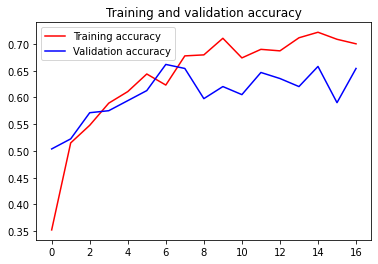

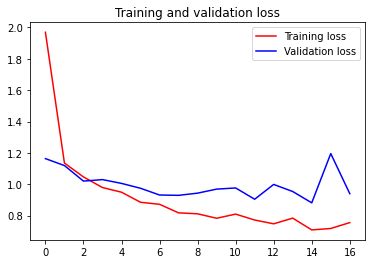

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

## Model 4

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

pre_trained_model.summary()

last layer output shape:  (None, 30, 30, 768)
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 255, 255, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 255, 255, 32  96         ['conv2d[0][0]']                 
 alization)                     )        

In [ ]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 30, 30, 768)


In [ ]:
# Flatten the output layer to 1 dimension
x = layers.Flatten()(last_output)
# First hidden layer
x = layers.Dense(128, activation='relu')(x)
# Second hidden layer
x = layers.Dense(64, activation='relu')(x)
x = layers.Dense(32, activation='relu')(x)
# Add a final sigmoid layer for classification
x = layers.Dense(5, activation='softmax')(x)           

# Append the dense network to the base model
model = Model(pre_trained_model.input, x) 

# Print the model summary. See your dense network connected at the end.
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 255, 255, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 255, 255, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
traingen = ImageDataGenerator(rescale = 1./255.,
                              rotation_range = 40,
                              width_shift_range = 0.2,
                              height_shift_range = 0.2,
                              shear_range = 0.2,
                              zoom_range = 0.2,
                              fill_mode = 'nearest',
                              horizontal_flip = True)

train_generator = traingen.flow_from_dataframe(
    train,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

valgen = ImageDataGenerator(rescale=1./255.)

validation_generator = valgen.flow_from_dataframe(
    val,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

Found 1064 validated image filenames belonging to 5 classes.
Found 266 validated image filenames belonging to 5 classes.


In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=10,verbose=1)

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=20,
                    batch_size=10,
                    callbacks=[checkpoint,earlystop],
                    verbose = 1)

Epoch 1/20
34/34 [==============================] - ETA: 0s - loss: 5.7058 - accuracy: 0.3242
Epoch 1: val_accuracy improved from -inf to 0.41353, saving model to CapstoneModel.h5
34/34 [==============================] - 177s 4s/step - loss: 5.7058 - accuracy: 0.3242 - val_loss: 2.0919 - val_accuracy: 0.4135
Epoch 2/20
34/34 [==============================] - ETA: 0s - loss: 2.1093 - accuracy: 0.4389
Epoch 2: val_accuracy improved from 0.41353 to 0.45489, saving model to CapstoneModel.h5
34/34 [==============================] - 78s 2s/step - loss: 2.1093 - accuracy: 0.4389 - val_loss: 1.5731 - val_accuracy: 0.4549
Epoch 3/20
34/34 [==============================] - ETA: 0s - loss: 1.7906 - accuracy: 0.4784
Epoch 3: val_accuracy did not improve from 0.45489
34/34 [==============================] - 77s 2s/step - loss: 1.7906 - accuracy: 0.4784 - val_loss: 3.2546 - val_accuracy: 0.3571
Epoch 4/20
34/34 [==============================] - ETA: 0s - loss: 1.4929 - accuracy: 0.5047
Epoch 4: v

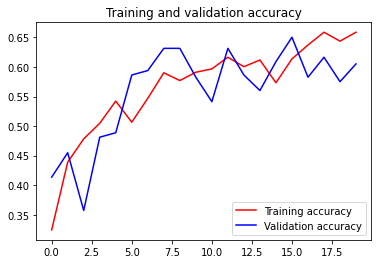

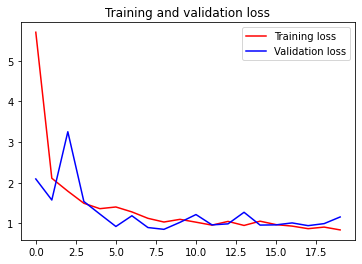

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

In [ ]:
import sys
if 'google.colab' in sys.modules:
  from google.colab import auth as google_auth
  google_auth.authenticate_user()
else:
  %env GOOGLE_APPLICATION_CREDENTIALS ''

MessageError: ignored

In [ ]:
model = tf.keras.models.load_model('CapstoneModel.h5')
tf.saved_model.save(model, "/content/drive/MyDrive/Capstone Project/models")
print("successfully saved keras model file to tensorflow model file")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Capstone Project/models/assets
successfully saved keras model file to tensorflow model file


In [ ]:
model.save('model.h5')

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

INFO:tensorflow:Assets written to: /tmp/tmph0yt60ms/assets


In [ ]:
import pathlib

tflite_model_file = pathlib.Path('model.tflite')
tflite_model_file.write_bytes(tflite_model)

389800272

## Model 5

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

pre_trained_model.summary()

last layer output shape:  (None, 30, 30, 768)
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 255, 255, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 255, 255, 32  96         ['conv2d[0][0]']                 
 alization)                     )        

In [ ]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 30, 30, 768)


In [ ]:
# Flatten the output layer to 1 dimension
x = layers.Flatten()(last_output)
# First hidden layer
x = layers.Dense(128, activation='relu')(x)
# Second hidden layer
x = layers.Dense(64, activation='relu')(x)
x = layers.Dense(32, activation='relu')(x)
# Add a final sigmoid layer for classification
x = layers.Dense(5, activation='softmax')(x)           

# Append the dense network to the base model
model = Model(pre_trained_model.input, x) 

# Print the model summary. See your dense network connected at the end.
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 255, 255, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 255, 255, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
traingen = ImageDataGenerator(rescale = 1./255.,
                              rotation_range = 40,
                              width_shift_range = 0.2,
                              height_shift_range = 0.2,
                              shear_range = 0.2,
                              zoom_range = 0.2,
                              fill_mode = 'nearest',
                              horizontal_flip = True)

train_generator = traingen.flow_from_dataframe(
    train,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

valgen = ImageDataGenerator(rescale=1./255.)

validation_generator = valgen.flow_from_dataframe(
    val,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

Found 864 validated image filenames belonging to 5 classes.
Found 466 validated image filenames belonging to 5 classes.


In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=10,verbose=1)

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=20,
                    batch_size=10,
                    callbacks=[checkpoint,earlystop],
                    verbose = 1)

Epoch 1/20
27/27 [==============================] - ETA: 0s - loss: 3.5333 - accuracy: 0.2905
Epoch 1: val_accuracy improved from -inf to 0.35837, saving model to CapstoneModel.h5
27/27 [==============================] - 68s 2s/step - loss: 3.5333 - accuracy: 0.2905 - val_loss: 1.7966 - val_accuracy: 0.3584
Epoch 2/20
27/27 [==============================] - ETA: 0s - loss: 1.4280 - accuracy: 0.4537
Epoch 2: val_accuracy improved from 0.35837 to 0.45064, saving model to CapstoneModel.h5
27/27 [==============================] - 61s 2s/step - loss: 1.4280 - accuracy: 0.4537 - val_loss: 1.2662 - val_accuracy: 0.4506
Epoch 3/20
27/27 [==============================] - ETA: 0s - loss: 1.2957 - accuracy: 0.4942
Epoch 3: val_accuracy improved from 0.45064 to 0.46781, saving model to CapstoneModel.h5
27/27 [==============================] - 60s 2s/step - loss: 1.2957 - accuracy: 0.4942 - val_loss: 1.4155 - val_accuracy: 0.4678
Epoch 4/20
27/27 [==============================] - ETA: 0s - loss:

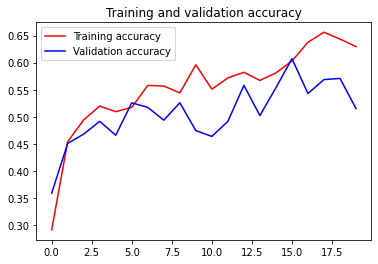

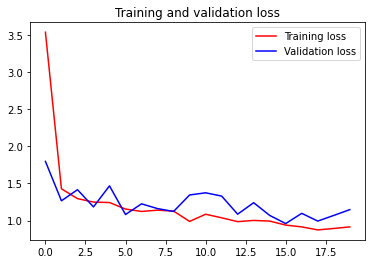

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

## Model 6

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

pre_trained_model.summary()

last layer output shape:  (None, 30, 30, 768)
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 255, 255, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 255, 255, 32  96         ['conv2d[0][0]']                 
 alization)                     )        

In [ ]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 30, 30, 768)


In [ ]:
# Flatten the output layer to 1 dimension
x = layers.Flatten()(last_output)
# First hidden layer
x = layers.Dense(128, activation='relu')(x)
# Second hidden layer
x = layers.Dense(64, activation='relu')(x)
x = layers.Dense(32, activation='relu')(x)
# Add a final sigmoid layer for classification
x = layers.Dense(5, activation='softmax')(x)           

# Append the dense network to the base model
model = Model(pre_trained_model.input, x) 

# Print the model summary. See your dense network connected at the end.
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 255, 255, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 255, 255, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
traingen = ImageDataGenerator(rescale = 1./255.,
                              rotation_range = 40,
                              width_shift_range = 0.2,
                              height_shift_range = 0.2,
                              shear_range = 0.2,
                              zoom_range = 0.2,
                              fill_mode = 'nearest',
                              horizontal_flip = True)

train_generator = traingen.flow_from_dataframe(
    train,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

valgen = ImageDataGenerator(rescale=1./255.)

validation_generator = valgen.flow_from_dataframe(
    val,
    directory=directory_preprocessed,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

Found 997 validated image filenames belonging to 5 classes.
Found 333 validated image filenames belonging to 5 classes.


In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=100,verbose=1)

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=70,
                    batch_size=10,
                    callbacks=[checkpoint,earlystop],
                    verbose = 1)

Epoch 1/70
32/32 [==============================] - ETA: 0s - loss: 6.0736 - accuracy: 0.3300
Epoch 1: val_accuracy improved from -inf to 0.44745, saving model to CapstoneModel.h5
32/32 [==============================] - 76s 2s/step - loss: 6.0736 - accuracy: 0.3300 - val_loss: 2.7526 - val_accuracy: 0.4474
Epoch 2/70
32/32 [==============================] - ETA: 0s - loss: 2.1990 - accuracy: 0.4072
Epoch 2: val_accuracy did not improve from 0.44745
32/32 [==============================] - 63s 2s/step - loss: 2.1990 - accuracy: 0.4072 - val_loss: 2.0381 - val_accuracy: 0.3724
Epoch 3/70
32/32 [==============================] - ETA: 0s - loss: 1.6445 - accuracy: 0.4704
Epoch 3: val_accuracy improved from 0.44745 to 0.47447, saving model to CapstoneModel.h5
32/32 [==============================] - 68s 2s/step - loss: 1.6445 - accuracy: 0.4704 - val_loss: 1.3661 - val_accuracy: 0.4745
Epoch 4/70
32/32 [==============================] - ETA: 0s - loss: 1.5133 - accuracy: 0.5075
Epoch 4: va

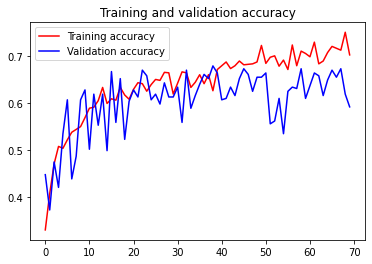

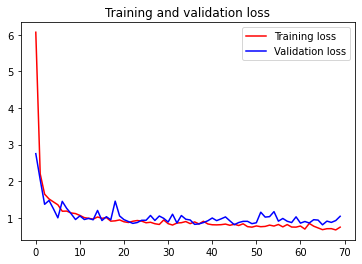

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()